# Draft analysis 

---

Group name: D

---


## Introduction

*This section includes an introduction to the project motivation, data, and research question. Include a data dictionary* 

## Setup

In [1]:
import pandas as pd
import altair as alt
import numpy as np
from pandas import DataFrame
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

alt.data_transformers.disable_max_rows() #aus Code overview Histogramm
from scipy import stats # to compute the mode 

from sklearn.linear_model import LinearRegression #Fitting a line
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LassoCV
from sklearn.linear_model import Lasso

import matplotlib.pyplot as plt  # To visualize

import joblib
import time

#### Definition für linksbündige Darstellung

In [2]:
def left_align(df: DataFrame):
    left_aligned_df = df.style.set_properties(**{'text-align': 'left'})
    left_aligned_df = left_aligned_df.set_table_styles(
        [dict(selector='th', props=[('text-align', 'left')])]
    )
    return left_aligned_df

## Data

## Import data

In [3]:
df_bevoelkerung = pd.read_csv(
    '../references/csv_Bevoelkerung/Zensus11_Datensatz_Bevoelkerung.csv',
    delimiter=';',
    dtype={
        'AGS_12': 'category',
        'RS_Land': 'category',
        'RS_RB_NUTS2': 'category',
        'RS_Kreis': 'category',
        'RS_VB': 'category',
        'RS_Gem': 'category',
        'Name': 'category',
        'Reg_Hier': 'category'
    }
)

/var/folders/k5/1ngg2lrs0p51m_z5s1q72vv00000gn/T/ipykernel_58605/3067287871.py:1: DtypeWarning: Columns (106,113,125,126,129,131,134,142,143,156,157,158,165,166,169,176,177,181,182,185,186,190,192,202,207,221) have mixed types. Specify dtype option on import or set low_memory=False.
  df_bevoelkerung = pd.read_csv(


### Data structure

In [4]:
df_bevoelkerung.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12544 entries, 0 to 12543
Columns: 223 entries, AGS_12 to BIL_5.8
dtypes: category(8), float64(41), int64(8), object(166)
memory usage: 21.4+ MB


### Data corrections

Datatype Korrekturen durchführen, sodass danach nur noch Category oder float vorhanden ist:
- interger in float verwandeln
- / und - in 0-Werte verwandeln, da diese im engeren Sinne als 0 zählen
- Zahlen in Klammern als normale Zahlen verwandeln

In [5]:
# integers in float verwandeln
for column in df_bevoelkerung.select_dtypes(['int64']):
    df_bevoelkerung[column] = df_bevoelkerung[column].astype('float64')

df_bevoelkerung = df_bevoelkerung.replace('/',0)
df_bevoelkerung = df_bevoelkerung.replace('-', 0)

for column in df_bevoelkerung.select_dtypes('object'):
    df_bevoelkerung[column]=df_bevoelkerung[column].astype(str).str.extract('(\d+)').astype('float64')

In [6]:
df_bevoelkerung.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12544 entries, 0 to 12543
Columns: 223 entries, AGS_12 to BIL_5.8
dtypes: category(8), float64(215)
memory usage: 21.4 MB


Check, ob Anpassung der Zahlung erfolgreich:

In [7]:
df_bevoelkerung.loc[df_bevoelkerung['Name'] == 'Barkenholm', ['DEM_2.7']]

,DEM_2.7
43,71.0


In [8]:
df_bevoelkerung.loc[df_bevoelkerung['Name']=='Bergewöhrden', ['DEM_2.10']]

,DEM_2.10
44,0.0


### Variable lists

In [9]:
df_predictor_variables = pd.read_excel('../references/Predictor Variables Definition.xlsx', index_col= 0)

In [10]:
left_align(df_predictor_variables)

,Quote,Berechnung
Variable,,
Migrationshintergrund,Migrationsquote,(Anzahl Personen mit Migrationshintergrund / Anzahl Personen insgesamt)
Religionszugehörigkeit,Christenquote*,(Römisch-katholische Kirche + Evangelische Kirch) / Bevölkerung nach Religion gesamt
Geschlecht,Männerquote,(Anzahl Männer / Einwohner gesamt)
Bildungsniveau,Akademikerquote**,(Fach- oder Berufsakademie + FH-Abschluss + Hochschulabschluss + Promotion) / höchster beruflicher Abschluss insgesamt
Stellung im Beruf,Beamtenquote,(Anzahl Beamter / Erwerbstätige insgesamt)
Familienstand,Singlequote***,(Anzahl Lediger + Verwitwete + Geschiedene + eingetragene Lebenspartnerschaft aufgehoben + Eingetragener Lebenspartner/- in verstorben + ohne Angaben) / Familienstand gesamt


#### Berechnung der Variablen im gesamten Dataset

In [11]:
df_bevoelkerung['Arbeitslosenquote'] = df_bevoelkerung['ERW_1.10'] / df_bevoelkerung['ERW_1.4']*100
df_bevoelkerung['Arbeitslosenquote2'] = (1-(df_bevoelkerung['ERW_1.7'] / df_bevoelkerung['ERW_1.4']))*100
df_bevoelkerung['Migrationsquote'] = df_bevoelkerung['MIG_1.3'] / df_bevoelkerung['MIG_1.1']*100
df_bevoelkerung['Migrationsquote2'] = (1-(df_bevoelkerung['MIG_1.2'] / df_bevoelkerung['MIG_1.1']))*100
df_bevoelkerung['Christenquote'] = ((df_bevoelkerung['REL_1.2'] + df_bevoelkerung['REL_1.3']) / df_bevoelkerung['REL_1.1'])*100
df_bevoelkerung['Männerquote'] = (df_bevoelkerung['DEM_1.2']  / df_bevoelkerung['DEM_1.1'])*100
df_bevoelkerung['Akademikerquote'] = ((df_bevoelkerung['BIL_5.5'] + df_bevoelkerung['BIL_5.6'] + df_bevoelkerung['BIL_5.7'] + df_bevoelkerung['BIL_5.8'])  / df_bevoelkerung['BIL_5.1'])*100
df_bevoelkerung['Beamtenquote'] = (df_bevoelkerung['ERW_2.3'] / df_bevoelkerung['ERW_2.1'])*100
df_bevoelkerung['Singlequote'] = ((df_bevoelkerung['DEM_2.4'] + df_bevoelkerung['DEM_2.10'] + df_bevoelkerung['DEM_2.13'] + df_bevoelkerung['DEM_2.19'] + df_bevoelkerung['DEM_2.22'] + df_bevoelkerung['DEM_2.25']) / df_bevoelkerung['DEM_2.1'])*100

In [12]:
df_bevoelkerung.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12544 entries, 0 to 12543
Columns: 232 entries, AGS_12 to Singlequote
dtypes: category(8), float64(224)
memory usage: 22.3 MB


In [13]:
df_bevoelkerung.head()

,AGS_12,RS_Land,RS_RB_NUTS2,RS_Kreis,RS_VB,RS_Gem,Name,Reg_Hier,AEWZ,DEM_1.1,...,BIL_5.8,Arbeitslosenquote,Arbeitslosenquote2,Migrationsquote,Migrationsquote2,Christenquote,Männerquote,Akademikerquote,Beamtenquote,Singlequote
0,0,0,NaN,NaN,NaN,NaN,Deutschland,Bund,80219695.0,80219695.0,...,908970.0,4.652478,4.652501,19.205282,19.205282,59.132542,48.798417,16.541543,5.080131,54.203097
1,1,1,NaN,NaN,NaN,NaN,Schleswig-Holstein,Land,2800119.0,2800119.0,...,25380.0,4.578416,4.578416,12.024768,12.024768,57.512020,48.586649,14.198910,6.676007,54.187161
2,10010000000,1,0,1,0,0,"Flensburg, Stadt",Gemeinde,82258.0,82258.0,...,0.0,6.657547,6.657547,15.957447,15.957447,56.027377,49.276666,13.355639,8.378114,62.147147
3,1001,1,0,1,NaN,NaN,"Flensburg, Stadt",Stadtkreis/kreisfreie Stadt/Landkreis,82258.0,82258.0,...,0.0,6.657547,6.657547,15.957447,15.957447,56.027377,49.276666,13.355639,8.378114,62.147147
4,10020000000,1,0,2,0,0,"Kiel, Landeshauptstadt",Gemeinde,235782.0,235782.0,...,4100.0,7.539341,7.539341,18.900021,18.900021,48.656386,48.139807,17.758138,7.578323,64.350968


### Data splitting
##### Dataframe auf relevante Spalten kürzen und auf Gemeinde bzw. Bundesländer filtern

Dataframe auf relevante Spalten filtern und in neues kopieren:

In [14]:
df_analyse = df_bevoelkerung.iloc[:, [6,7,223,224,225,226,227,228,229,230,231]].copy()

NaN entfernen:

In [15]:
df_analyse.dropna(inplace=True)

In [16]:
df_analyse

,Name,Reg_Hier,Arbeitslosenquote,Arbeitslosenquote2,Migrationsquote,Migrationsquote2,Christenquote,Männerquote,Akademikerquote,Beamtenquote,Singlequote
0,Deutschland,Bund,4.652478,4.652501,19.205282,19.205282,59.132542,48.798417,16.541543,5.080131,54.203097
1,Schleswig-Holstein,Land,4.578416,4.578416,12.024768,12.024768,57.512020,48.586649,14.198910,6.676007,54.187161
2,"Flensburg, Stadt",Gemeinde,6.657547,6.657547,15.957447,15.957447,56.027377,49.276666,13.355639,8.378114,62.147147
3,"Flensburg, Stadt",Stadtkreis/kreisfreie Stadt/Landkreis,6.657547,6.657547,15.957447,15.957447,56.027377,49.276666,13.355639,8.378114,62.147147
4,"Kiel, Landeshauptstadt",Gemeinde,7.539341,7.539341,18.900021,18.900021,48.656386,48.139807,17.758138,7.578323,64.350968
...,...,...,...,...,...,...,...,...,...,...,...
12492,"Zeulenroda-Triebes, Stadt",Gemeinde,5.662651,5.662651,3.547963,3.613666,28.863238,48.219960,12.058824,4.342273,51.721678
12497,Altenburger Land,Stadtkreis/kreisfreie Stadt/Landkreis,7.879628,7.879628,1.858003,1.868383,17.894911,48.803457,12.459584,3.460133,50.574237
12498,"Altenburg, Stadt",Gemeinde,9.632751,9.632751,1.978736,1.978736,13.745967,47.926078,13.866232,3.530979,53.276621
12500,"Meuselwitz, Stadt",Gemeinde,9.363958,9.363958,2.098540,2.098540,11.446552,48.403867,8.841463,3.118908,49.872309


Liste mit Prädikatoren:

In [17]:
predictor = df_analyse.iloc[:,5:11].columns.values.tolist()
predictor

['Migrationsquote2',
 'Christenquote',
 'Männerquote',
 'Akademikerquote',
 'Beamtenquote',
 'Singlequote']

Dataframe auf Hierarchie-Ebene **Gemeinde** filtern.

In [18]:
df_analyse_gemeinde = df_analyse[df_analyse['Reg_Hier']=='Gemeinde'].reset_index(drop=True)

In [19]:
df_analyse_gemeinde

,Name,Reg_Hier,Arbeitslosenquote,Arbeitslosenquote2,Migrationsquote,Migrationsquote2,Christenquote,Männerquote,Akademikerquote,Beamtenquote,Singlequote
0,"Flensburg, Stadt",Gemeinde,6.657547,6.657547,15.957447,15.957447,56.027377,49.276666,13.355639,8.378114,62.147147
1,"Kiel, Landeshauptstadt",Gemeinde,7.539341,7.539341,18.900021,18.900021,48.656386,48.139807,17.758138,7.578323,64.350968
2,"Lübeck, Hansestadt",Gemeinde,7.158110,7.167394,16.812500,16.812500,56.723806,47.470103,13.992802,6.540654,59.120801
3,"Neumünster, Stadt",Gemeinde,6.924644,6.899185,16.924489,16.924489,56.149594,48.816166,8.385235,6.015860,56.965139
4,"Brunsbüttel, Stadt",Gemeinde,5.365854,5.365854,13.682565,13.682565,62.607137,49.579243,6.877828,4.123711,51.277856
...,...,...,...,...,...,...,...,...,...,...,...
1568,"Greiz, Stadt",Gemeinde,6.813820,6.813820,2.112338,2.112338,25.183037,47.736997,13.745338,3.089598,53.023676
1569,"Zeulenroda-Triebes, Stadt",Gemeinde,5.662651,5.662651,3.547963,3.613666,28.863238,48.219960,12.058824,4.342273,51.721678
1570,"Altenburg, Stadt",Gemeinde,9.632751,9.632751,1.978736,1.978736,13.745967,47.926078,13.866232,3.530979,53.276621
1571,"Meuselwitz, Stadt",Gemeinde,9.363958,9.363958,2.098540,2.098540,11.446552,48.403867,8.841463,3.118908,49.872309


In [20]:
df_analyse_gemeinde.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1573 entries, 0 to 1572
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   Name                1573 non-null   category
 1   Reg_Hier            1573 non-null   category
 2   Arbeitslosenquote   1573 non-null   float64 
 3   Arbeitslosenquote2  1573 non-null   float64 
 4   Migrationsquote     1573 non-null   float64 
 5   Migrationsquote2    1573 non-null   float64 
 6   Christenquote       1573 non-null   float64 
 7   Männerquote         1573 non-null   float64 
 8   Akademikerquote     1573 non-null   float64 
 9   Beamtenquote        1573 non-null   float64 
 10  Singlequote         1573 non-null   float64 
dtypes: category(2), float64(9)
memory usage: 465.3 KB


In [21]:
# define outcome variable as y_label
y_label = 'Arbeitslosenquote2'

# select features
features = predictor

# create feature data
X = df_analyse_gemeinde[features]

# create response
y = df_analyse_gemeinde[y_label]

#### Data Splitting - train & test data

In [22]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.2,
                                                    random_state=42)

In [23]:
# data exploration set
df_train = pd.DataFrame(X_train.copy())
df_train = df_train.join(pd.DataFrame(y_train))

In [24]:
df_train

,Migrationsquote2,Christenquote,Männerquote,Akademikerquote,Beamtenquote,Singlequote,Arbeitslosenquote2
1041,29.206142,73.971140,48.100815,18.275467,5.090006,53.898667,2.363636
277,18.195158,80.491887,49.356036,10.834050,4.965517,52.041039,2.945114
1223,33.358298,67.257531,47.849582,16.443128,3.807391,55.075046,3.563715
925,21.221751,75.438658,48.500299,16.352459,5.246523,50.564366,1.678061
1161,25.235602,85.163236,49.448950,10.391198,5.534351,50.207943,2.420857
...,...,...,...,...,...,...,...
1130,19.279854,60.266185,46.379427,30.991957,5.922747,53.891270,3.158770
1294,12.534626,81.905846,49.614947,12.569170,6.327373,51.597134,4.216074
860,19.919110,65.085772,48.678103,16.607774,4.291045,50.232089,3.423423
1459,4.362730,14.812994,48.360429,13.388544,2.231237,52.158948,10.526316


Dataframe auf Ebene Bundesland filtern:

In [25]:
df_analyse_bund = df_analyse[df_analyse['Reg_Hier']=='Land'].reset_index(drop=True)

In [26]:
df_analyse_bund

,Name,Reg_Hier,Arbeitslosenquote,Arbeitslosenquote2,Migrationsquote,Migrationsquote2,Christenquote,Männerquote,Akademikerquote,Beamtenquote,Singlequote
0,Schleswig-Holstein,Land,4.578416,4.578416,12.024768,12.024768,57.512020,48.586649,14.198910,6.676007,54.187161
1,Hamburg,Land,5.664054,5.664054,28.301597,28.301597,39.577054,48.365438,23.635275,4.521244,61.686205
2,Niedersachsen,Land,4.401018,4.401018,16.725965,16.726094,65.962115,48.904344,13.676174,5.798117,53.289024
3,Bremen,Land,6.646302,6.646302,26.452131,26.452131,51.082332,48.566595,18.274408,5.146615,60.012015
4,Nordrhein-Westfalen,Land,5.095187,5.095187,24.451495,24.451495,67.909493,48.567748,15.288151,5.245268,53.513457
5,Hessen,Land,3.883143,3.883143,25.473128,25.473128,63.148731,48.793566,18.289708,4.978489,53.313280
6,Rheinland-Pfalz,Land,3.787513,3.787048,19.088275,19.088023,74.492607,48.883355,13.877359,6.134863,52.208653
7,Baden-Württemberg,Land,3.134949,3.134949,25.678058,25.678058,69.060549,48.943658,16.920449,4.981700,53.377529
8,Bayern,Land,2.853099,2.853099,19.116721,19.116721,74.162141,48.902160,16.963287,5.053229,53.829801
9,Saarland,Land,4.393987,4.395949,16.344238,16.343231,81.104376,48.523293,12.916943,5.696280,52.839520


Variablen Migration:

In [27]:
variables_migration = ['Reg_Hier','Name','ERW_1.4','ERW_1.10','MIG_1.1','MIG_1.2','MIG_1.3','MIG_1.4','MIG_1.5','MIG_1.6','MIG_1.7','MIG_1.8','MIG_1.9','MIG_1.10','MIG_1.11','MIG_2.1','MIG_2.2','MIG_2.3','MIG_2.4','MIG_2.5','MIG_2.6','MIG_2.7','MIG_2.8','MIG_3.1','MIG_3.2','MIG_3.3','MIG_3.4','MIG_3.5']

Variablen Religion:

In [28]:
variables_religion = ['Reg_Hier','Name','ERW_1.4','ERW_1.10','REL_1.1','REL_1.2','REL_1.3','REL_1.4']

Variablen Geschlecht:

In [29]:
variables_geschlecht= ['Reg_Hier','Name','ERW_1.4','ERW_1.10','DEM_1.1','DEM_1.2','DEM_1.3']

Variablen Bildung:

In [30]:
variables_bildung= ['Reg_Hier','Name','ERW_1.4','ERW_1.10','BIL_5.1','BIL_5.2','BIL_5.3','BIL_5.4','BIL_5.5','BIL_5.6','BIL_5.7','BIL_5.8']

Variablen Beruf:

In [31]:
variables_beruf = ['Reg_Hier','Name','ERW_1.4','ERW_1.10','ERW_2.1','ERW_2.2','ERW_2.3','ERW_2.4','ERW_2.5','ERW_2.6']

Variablen Familien:

In [32]:
variables_familien = ['Reg_Hier','Name','ERW_1.4','ERW_1.10','DEM_2.1','DEM_2.4','DEM_2.7','DEM_2.10','DEM_2.13','DEM_2.16','DEM_2.19','DEM_2.22','DEM_2.25']

## Analysis

### Descriptive statistics

In [33]:
df_analyse_gemeinde.describe().T

,count,mean,std,min,25%,50%,75%,max
Arbeitslosenquote,1573.0,4.129315,2.237428,0.000000,2.794760,3.618907,5.016766,16.871705
Arbeitslosenquote2,1573.0,4.225062,2.100031,0.780031,2.796174,3.619303,5.022500,16.871705
Migrationsquote,1573.0,17.750686,9.632732,0.000000,10.633649,17.838900,24.120116,53.932014
Migrationsquote2,1573.0,17.752142,9.628915,0.850662,10.663616,17.836257,24.120116,53.982750
Christenquote,1573.0,62.137232,20.945943,5.933338,58.604711,68.010543,75.942976,93.909239
Männerquote,1573.0,48.697872,0.843340,45.102669,48.190799,48.702359,49.177376,54.993659
Akademikerquote,1573.0,13.770178,5.853955,2.092871,9.776536,12.344777,16.242999,47.997457
Beamtenquote,1573.0,5.067968,1.740783,1.236476,3.889789,4.892966,6.017192,18.870728
Singlequote,1573.0,52.214032,3.013940,44.397914,50.252657,51.690254,53.661406,66.462950


In [34]:
df_analyse_gemeinde_long = df_analyse_gemeinde.iloc[:,2:11].melt(var_name="Quotenname",value_name="Quote")
df_analyse_gemeinde_long

,Quotenname,Quote
0,Arbeitslosenquote,6.657547
1,Arbeitslosenquote,7.539341
2,Arbeitslosenquote,7.158110
3,Arbeitslosenquote,6.924644
4,Arbeitslosenquote,5.365854
...,...,...
14152,Singlequote,53.023676
14153,Singlequote,51.721678
14154,Singlequote,53.276621
14155,Singlequote,49.872309


In [35]:
alt.Chart(df_analyse_gemeinde_long).mark_area(
    opacity=0.5,
    interpolate='step'
).encode(
    alt.X('Quote:Q', bin=alt.Bin(maxbins=50)),
    alt.Y('count()', stack=None),
    alt.Color('Quotenname:N'),
    tooltip = ['Quotenname']
).properties(
    title="Zusammenfassendes Histogramm der Quoten"
).interactive()

alt.Chart(...)

In [36]:
Quoten = df_analyse_gemeinde.iloc[:,2:12].columns.values.tolist()

In [37]:

alt.Chart(df_analyse_gemeinde, width=200, height=150).mark_bar().encode(
    alt.X(alt.repeat("repeat"), type="quantitative", bin=True),
    y='count()'
).repeat(
    repeat=Quoten,
    columns=3
)

alt.RepeatChart(...)

In [38]:
source = df_analyse_gemeinde
hist = alt.Chart(source).mark_bar().encode(
    x=alt.X("Arbeitslosenquote2", 
            bin=True),
    y='count()',
)

In [39]:
# Boxplot 
box = alt.Chart(source).mark_boxplot().encode(
    x='Arbeitslosenquote2',
)

In [40]:
alt.vconcat(hist, box)

alt.VConcatChart(...)

In [41]:
df_analyse_gemeinde["Arbeitslosenquote2"].describe()


count    1573.000000
mean        4.225062
std         2.100031
min         0.780031
25%         2.796174
50%         3.619303
75%         5.022500
max        16.871705
Name: Arbeitslosenquote2, dtype: float64

In [42]:
hist = alt.Chart(source).mark_bar().encode(
    alt.X(
        "Arbeitslosenquote2",
        bin=True,
        scale=alt.Scale(zero=True)
    ),
    alt.Y('count()')
)
box = alt.Chart(source).mark_boxplot().encode(
    x=alt.X(
        'Arbeitslosenquote2',
        scale=alt.Scale(zero=True)
    )
)

print(source['Arbeitslosenquote2'].describe())
alt.vconcat(hist, box,).properties(title='Übersicht Arbeitslosenquote').configure_title(fontSize = 20)

count    1573.000000
mean        4.225062
std         2.100031
min         0.780031
25%         2.796174
50%         3.619303
75%         5.022500
max        16.871705
Name: Arbeitslosenquote2, dtype: float64


alt.VConcatChart(...)

In [43]:
hist = alt.Chart(source).mark_bar().encode(
    alt.X(
        "Migrationsquote",
        bin=True,
        scale=alt.Scale(zero=True)
    ),
    alt.Y('count()')
)
box = alt.Chart(source).mark_boxplot().encode(
    x=alt.X(
        'Migrationsquote',
        scale=alt.Scale(zero=True)
    )
)

print(source['Migrationsquote'].describe())
Migrationsquote = alt.vconcat(hist, box,).properties(title='Übersicht Migrationsquote').configure_title(fontSize = 20)
Migrationsquote

count    1573.000000
mean       17.750686
std         9.632732
min         0.000000
25%        10.633649
50%        17.838900
75%        24.120116
max        53.932014
Name: Migrationsquote, dtype: float64


alt.VConcatChart(...)

In [44]:
hist = alt.Chart(source).mark_bar().encode(
    alt.X(
        "Migrationsquote2",
        bin=True,
        scale=alt.Scale(zero=True)
    ),
    alt.Y('count()')
)
box = alt.Chart(source).mark_boxplot().encode(
    x=alt.X(
        'Migrationsquote2',
        scale=alt.Scale(zero=True)
    )
)

print(source['Migrationsquote2'].describe())
alt.vconcat(hist, box,).properties(title='Übersicht Migrationsquote2').configure_title(fontSize = 20)

count    1573.000000
mean       17.752142
std         9.628915
min         0.850662
25%        10.663616
50%        17.836257
75%        24.120116
max        53.982750
Name: Migrationsquote2, dtype: float64


alt.VConcatChart(...)

In [45]:
hist = alt.Chart(source).mark_bar().encode(
    alt.X(
        "Christenquote",
        bin=True,
        scale=alt.Scale(zero=True)
    ),
    alt.Y('count()')
)
box = alt.Chart(source).mark_boxplot().encode(
    x=alt.X(
        'Christenquote',
        scale=alt.Scale(zero=True)
    )
)

print(source['Christenquote'].describe())
alt.vconcat(hist, box,).properties(title='Übersicht Christenquote').configure_title(fontSize = 20)

count    1573.000000
mean       62.137232
std        20.945943
min         5.933338
25%        58.604711
50%        68.010543
75%        75.942976
max        93.909239
Name: Christenquote, dtype: float64


alt.VConcatChart(...)

In [46]:
hist = alt.Chart(source).mark_bar().encode(
    alt.X(
        "Männerquote",
        bin=True,
        scale=alt.Scale(zero=True)
    ),
    alt.Y('count()')
)
box = alt.Chart(source).mark_boxplot().encode(
    x=alt.X(
        'Männerquote',
        scale=alt.Scale(zero=True)
    )
)

print(source['Männerquote'].describe())
alt.vconcat(hist, box,).properties(title='Übersicht Männerquote').configure_title(fontSize = 20)

count    1573.000000
mean       48.697872
std         0.843340
min        45.102669
25%        48.190799
50%        48.702359
75%        49.177376
max        54.993659
Name: Männerquote, dtype: float64


alt.VConcatChart(...)

In [47]:
hist = alt.Chart(source).mark_bar().encode(
    alt.X(
        "Akademikerquote",
        bin=True,
        scale=alt.Scale(zero=True)
    ),
    alt.Y('count()')
)
box = alt.Chart(source).mark_boxplot().encode(
    x=alt.X(
        'Akademikerquote',
        scale=alt.Scale(zero=True)
    )
)

print(source['Akademikerquote'].describe())
alt.vconcat(hist, box,).properties(title='Übersicht Akademikerquote').configure_title(fontSize = 20)

count    1573.000000
mean       13.770178
std         5.853955
min         2.092871
25%         9.776536
50%        12.344777
75%        16.242999
max        47.997457
Name: Akademikerquote, dtype: float64


alt.VConcatChart(...)

In [48]:
hist = alt.Chart(source).mark_bar().encode(
    alt.X(
        "Beamtenquote",
        bin=True,
        scale=alt.Scale(zero=True)
    ),
    alt.Y('count()')
)
box = alt.Chart(source).mark_boxplot().encode(
    x=alt.X(
        'Beamtenquote',
        scale=alt.Scale(zero=True)
    )
)

print(source['Beamtenquote'].describe())
alt.vconcat(hist, box,).properties(title='Übersicht Beamtenquote').configure_title(fontSize = 20)

count    1573.000000
mean        5.067968
std         1.740783
min         1.236476
25%         3.889789
50%         4.892966
75%         6.017192
max        18.870728
Name: Beamtenquote, dtype: float64


alt.VConcatChart(...)

In [49]:
hist = alt.Chart(source).mark_bar().encode(
    alt.X(
        "Singlequote",
        bin=True,
        scale=alt.Scale(zero=True)
    ),
    alt.Y('count()')
)
box = alt.Chart(source).mark_boxplot().encode(
    x=alt.X(
        'Singlequote',
        scale=alt.Scale(zero=True)
    )
)

print(source['Singlequote'].describe())
alt.vconcat(hist, box,).properties(title='Übersicht Singlequote').configure_title(fontSize = 20)

count    1573.000000
mean       52.214032
std         3.013940
min        44.397914
25%        50.252657
50%        51.690254
75%        53.661406
max        66.462950
Name: Singlequote, dtype: float64


alt.VConcatChart(...)

### Exploratory data analysis

### Relationships

In [50]:
alt.Chart(source, width=200, height=150).mark_circle(size=60).encode(
    alt.X(
        alt.repeat("repeat"), 
        type="quantitative",
        scale=alt.Scale(zero=False)),
    alt.Y('Arbeitslosenquote2'),
    tooltip = ['Name',alt.Tooltip(alt.repeat("repeat"), type="quantitative"), alt.Y('Arbeitslosenquote2')]
).repeat(
    repeat=predictor,
    columns=4
).interactive()

alt.RepeatChart(...)

In [51]:
alt.Chart(source).mark_circle(size=60).encode(
    x=alt.X('Migrationsquote2'),
    y=alt.Y('Arbeitslosenquote2', 
            title='ALO_Quote'),
    tooltip=['Migrationsquote2', 'Arbeitslosenquote2','Name']
).interactive()

alt.Chart(...)

In [52]:
corr_data = source[['Migrationsquote2','Arbeitslosenquote2']]
corr = corr_data.corr(method='pearson').round(5)
corr

,Migrationsquote2,Arbeitslosenquote2
Migrationsquote2,1.00000,-0.27309
Arbeitslosenquote2,-0.27309,1.00000


In [53]:
corr_blues = corr.style.background_gradient(cmap='Blues')
corr_blues

,Migrationsquote2,Arbeitslosenquote2
Migrationsquote2,1.000000,-0.273090
Arbeitslosenquote2,-0.273090,1.000000


In [54]:
corr_list = corr['Arbeitslosenquote2'].sort_values(ascending=False)
corr_list

Arbeitslosenquote2    1.00000
Migrationsquote2     -0.27309
Name: Arbeitslosenquote2, dtype: float64

In [55]:
# inspect correlation between outcome and possible predictors
corr = df_train.corr(method = 'pearson').round(5)
corr[y_label].sort_values(ascending=False)

Arbeitslosenquote2    1.00000
Singlequote           0.44441
Akademikerquote      -0.10260
Männerquote          -0.23303
Beamtenquote         -0.25672
Migrationsquote2     -0.29545
Christenquote        -0.66274
Name: Arbeitslosenquote2, dtype: float64

In [56]:
# take a look at all correlations
corr.style.background_gradient(cmap='Blues')

,Migrationsquote2,Christenquote,Männerquote,Akademikerquote,Beamtenquote,Singlequote,Arbeitslosenquote2
Migrationsquote2,1.000000,0.430310,-0.049660,0.093810,-0.014510,0.063220,-0.295450
Christenquote,0.430310,1.000000,0.153050,-0.253270,0.286860,-0.315040,-0.662740
Männerquote,-0.049660,0.153050,1.000000,-0.303060,-0.091700,-0.274020,-0.233030
Akademikerquote,0.093810,-0.253270,-0.303060,1.000000,0.273150,0.239260,-0.102600
Beamtenquote,-0.014510,0.286860,-0.091700,0.273150,1.000000,-0.039460,-0.256720
Singlequote,0.063220,-0.315040,-0.274020,0.239260,-0.039460,1.000000,0.444410
Arbeitslosenquote2,-0.295450,-0.662740,-0.233030,-0.102600,-0.256720,0.444410,1.000000


## Model

### Select model

In [57]:
data = df_analyse_gemeinde.dropna()[['Name','Migrationsquote2', 'Arbeitslosenquote2']]
data

,Name,Migrationsquote2,Arbeitslosenquote2
0,"Flensburg, Stadt",15.957447,6.657547
1,"Kiel, Landeshauptstadt",18.900021,7.539341
2,"Lübeck, Hansestadt",16.812500,7.167394
3,"Neumünster, Stadt",16.924489,6.899185
4,"Brunsbüttel, Stadt",13.682565,5.365854
...,...,...,...
1568,"Greiz, Stadt",2.112338,6.813820
1569,"Zeulenroda-Triebes, Stadt",3.613666,5.662651
1570,"Altenburg, Stadt",1.978736,9.632751
1571,"Meuselwitz, Stadt",2.098540,9.363958


In [58]:
data.describe()

,Migrationsquote2,Arbeitslosenquote2
count,1573.000000,1573.000000
mean,17.752142,4.225062
std,9.628915,2.100031
min,0.850662,0.780031
25%,10.663616,2.796174
50%,17.836257,3.619303
75%,24.120116,5.022500
max,53.982750,16.871705


In [59]:
y_label = "Arbeitslosenquote2"

X = data[["Migrationsquote2"]]
y = data[y_label]

In [60]:
# Choose the linear regression model
reg_test = LinearRegression()

In [61]:
# Fit the model to the data
reg_test.fit(X, y)

LinearRegression()

In [62]:
print(f' Intercept: {reg_test.intercept_:.4} \n Slope: {reg_test.coef_[0]:.3}')

 Intercept: 5.282 
 Slope: -0.0596


In [63]:
# Intercept
reg_test.intercept_

5.282378184546983

In [64]:
# Slope
reg_test.coef_

array([-0.0595599])

In [65]:
# Make predictions on the data
y_pred = reg_test.predict(X)
y_pred

array([4.33195426, 4.15669481, 4.28102737, ..., 5.16452487, 5.15738934,
       5.0614053 ])

In [66]:
mean_squared_error(y, y_pred)

4.078635290942068

In [67]:
mean_squared_error(y, y_pred, squared=False)

2.0195631435887487

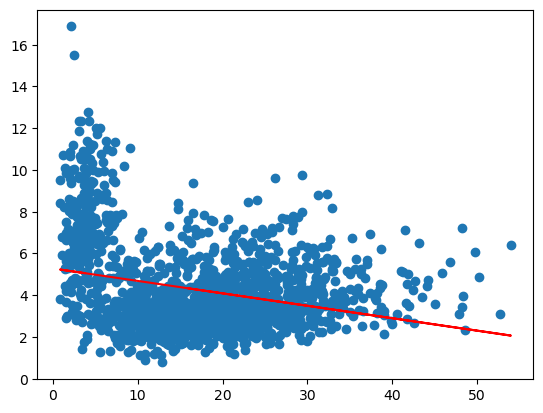

In [68]:
x_Scatter =  data['Migrationsquote2']
y_Scatter = data['Arbeitslosenquote2']

X = data[["Migrationsquote2"]]
y_pred = y_pred

plt.scatter(x_Scatter, y_Scatter)
plt.plot(X, y_pred, color='red')
plt.show()

In [69]:
reg_mig = LinearRegression()
reg_chr = LinearRegression()
reg_sin = LinearRegression()
reg_multi=LinearRegression()

### Select Model Lasso

In [70]:
X_train_lasso = X_train.copy()
X_test_lasso = X_test.copy()
scaler = StandardScaler().fit(X_train[features]) 

X_train_lasso[features] = scaler.transform(X_train_lasso[features])
X_test_lasso[features] = scaler.transform(X_test_lasso[features])

In [71]:
X_train

,Migrationsquote2,Christenquote,Männerquote,Akademikerquote,Beamtenquote,Singlequote
1041,29.206142,73.971140,48.100815,18.275467,5.090006,53.898667
277,18.195158,80.491887,49.356036,10.834050,4.965517,52.041039
1223,33.358298,67.257531,47.849582,16.443128,3.807391,55.075046
925,21.221751,75.438658,48.500299,16.352459,5.246523,50.564366
1161,25.235602,85.163236,49.448950,10.391198,5.534351,50.207943
...,...,...,...,...,...,...
1130,19.279854,60.266185,46.379427,30.991957,5.922747,53.891270
1294,12.534626,81.905846,49.614947,12.569170,6.327373,51.597134
860,19.919110,65.085772,48.678103,16.607774,4.291045,50.232089
1459,4.362730,14.812994,48.360429,13.388544,2.231237,52.158948


In [72]:
# select the lasso model with built in crossvalidation
reg = LassoCV(cv=5, random_state=0)

### Training and validation

In [73]:
# cross-validation with 5 folds
scores_mig = cross_val_score(reg_mig, X_train[['Migrationsquote2']], y_train, cv=5, scoring='neg_mean_squared_error') *-1
scores_chr = cross_val_score(reg_chr, X_train[['Christenquote']], y_train, cv=5, scoring='neg_mean_squared_error') *-1
scores_sin = cross_val_score(reg_sin, X_train[['Singlequote']], y_train, cv=5, scoring='neg_mean_squared_error') *-1
# cross-validation with 5 folds total
scores = cross_val_score(reg_multi, X_train, y_train, cv=5, scoring='neg_mean_squared_error') *-1

In [74]:
# store cross-validation scores: Migrationsquote, Christenquote und Singlequote
df_scores_mig = pd.DataFrame({"lr": scores_mig})
df_scores_chr = pd.DataFrame({"lr": scores_chr})
df_scores_sin = pd.DataFrame({"lr": scores_sin})

# reset index to match the number of folds
df_scores_mig.index += 1
df_scores_chr.index += 1
df_scores_sin.index += 1

# print dataframe

df_scores_mig.style.background_gradient(cmap='Blues')

,lr
1,3.914431
2,3.731555
3,3.467859
4,4.145899
5,4.440537


In [75]:
#Christenquote
df_scores_chr.style.background_gradient(cmap='Blues')

,lr
1,2.060155
2,2.423749
3,2.352862
4,2.447104
5,2.804205


In [76]:
#Singlequote
df_scores_sin.style.background_gradient(cmap='Blues')

,lr
1,3.449375
2,3.092362
3,2.863533
4,3.594474
5,4.297317


In [77]:
# store cross-validation scores Multiple Regression
df_scores = pd.DataFrame({"lr": scores})

# reset index to match the number of folds Multiple Regression
df_scores.index += 1

# print dataframe
df_scores.style.background_gradient(cmap='Blues')

,lr
1,1.443932
2,1.526375
3,1.385411
4,1.527816
5,2.038018


Chart Folds Migrationsquote

In [78]:
alt.Chart(df_scores_mig.reset_index()).mark_line(
     point=alt.OverlayMarkDef()
).encode(
    x=alt.X("index", bin=False, title="Fold", axis=alt.Axis(tickCount=5)),
    y=alt.Y("lr", aggregate="mean", title="Mean squared error (MSE)")
)

alt.Chart(...)

Chart Folds Christenquote

In [79]:
alt.Chart(df_scores_chr.reset_index()).mark_line(
     point=alt.OverlayMarkDef()
).encode(
    x=alt.X("index", bin=False, title="Fold", axis=alt.Axis(tickCount=5)),
    y=alt.Y("lr", aggregate="mean", title="Mean squared error (MSE)")
)

alt.Chart(...)

Chart Folds Singlequote

In [80]:
alt.Chart(df_scores_sin.reset_index()).mark_line(
     point=alt.OverlayMarkDef()
).encode(
    x=alt.X("index", bin=False, title="Fold", axis=alt.Axis(tickCount=5)),
    y=alt.Y("lr", aggregate="mean", title="Mean squared error (MSE)")
)

alt.Chart(...)

Chart Folds Multiple Regression

In [81]:
alt.Chart(df_scores.reset_index()).mark_line(
     point=alt.OverlayMarkDef()
).encode(
    x=alt.X("index", bin=False, title="Fold", axis=alt.Axis(tickCount=5)),
    y=alt.Y("lr", aggregate="mean", title="Mean squared error (MSE)")
)

alt.Chart(...)

In [82]:
df_scores_mig.describe().T

,count,mean,std,min,25%,50%,75%,max
lr,5.0,3.940056,0.37415,3.467859,3.731555,3.914431,4.145899,4.440537


In [83]:
df_scores_chr.describe().T

,count,mean,std,min,25%,50%,75%,max
lr,5.0,2.417615,0.265673,2.060155,2.352862,2.423749,2.447104,2.804205


In [84]:
df_scores_sin.describe().T

,count,mean,std,min,25%,50%,75%,max
lr,5.0,3.459412,0.550051,2.863533,3.092362,3.449375,3.594474,4.297317


In [85]:
df_scores.describe().T

,count,mean,std,min,25%,50%,75%,max
lr,5.0,1.584311,0.260608,1.385411,1.443932,1.526375,1.527816,2.038018


### Training & Best Alpha Lasso Regression

In [86]:
reg.fit(X_train_lasso, y_train)

LassoCV(cv=5, random_state=0)

In [87]:
reg.alpha_

0.0063775417634839085

### Fit model

In [88]:
# Fit the model to the complete training data
reg_mig.fit(X_train[['Migrationsquote2']], y_train)
reg_chr.fit(X_train[['Christenquote']], y_train)
reg_sin.fit(X_train[['Singlequote']], y_train)

LinearRegression()

In [89]:
# Fit the model to the complete training data
reg_multi.fit(X_train, y_train)

LinearRegression()

Migrationsquote

In [90]:
# intercept
intercept = pd.DataFrame({
    "Name": ["Intercept"],
    "Coefficient":[reg_mig.intercept_]}
    )

# make a slope table
slope = pd.DataFrame({
    "Name": 'slope',
    "Coefficient": reg_mig.coef_}
)

# combine estimates of intercept and slope
table = pd.concat([intercept, slope], ignore_index=True, sort=False)

round(table, 3)

,Name,Coefficient
0,Intercept,5.342
1,slope,-0.064


Christenquote

In [91]:
# intercept
intercept = pd.DataFrame({
    "Name": ["Intercept"],
    "Coefficient":[reg_chr.intercept_]}
    )

# make a slope table
slope = pd.DataFrame({
    "Name": 'slope',
    "Coefficient": reg_chr.coef_}
)

# combine estimates of intercept and slope
table = pd.concat([intercept, slope], ignore_index=True, sort=False)

round(table, 3)

,Name,Coefficient
0,Intercept,8.241
1,slope,-0.065


Singlequote

In [92]:
# intercept
intercept = pd.DataFrame({
    "Name": ["Intercept"],
    "Coefficient":[reg_sin.intercept_]}
    )

# make a slope table
slope = pd.DataFrame({
    "Name": 'slope',
    "Coefficient": reg_sin.coef_}
)

# combine estimates of intercept and slope
table = pd.concat([intercept, slope], ignore_index=True, sort=False)

round(table, 3)

,Name,Coefficient
0,Intercept,-12.168
1,slope,0.314


Multiple Regression

In [93]:
# intercept
intercept = pd.DataFrame({
    "Name": ["Intercept"],
    "Coefficient":[reg_multi.intercept_]}
    )

# make a slope table
slope = pd.DataFrame({
    "Name": features,
    "Coefficient": reg_multi.coef_}
)

# combine estimates of intercept and slopes
table = pd.concat([intercept, slope], ignore_index=True, sort=False)

round(table, 3)

,Name,Coefficient
0,Intercept,20.239
1,Migrationsquote2,-0.000
2,Christenquote,-0.064
3,Männerquote,-0.428
4,Akademikerquote,-0.147
5,Beamtenquote,0.044
6,Singlequote,0.203


### Fit Model Lasso Regression

In [94]:
# Fit the model to the complete training data
reg = Lasso(alpha=reg.alpha_)
reg.fit(X_train_lasso, y_train)

Lasso(alpha=0.0063775417634839085)

In [95]:
# intercept
intercept = pd.DataFrame({
    "Name": ["Intercept"],
    "Coefficient":[reg.intercept_]}
    )

# make a slope table
slope = pd.DataFrame({
    "Name": features,
    "Coefficient": reg.coef_}
)

# combine estimates of intercept and slopes
table = pd.concat([intercept, slope], ignore_index=True, sort=False)

round(table, 3)

,Name,Coefficient
0,Intercept,4.215
1,Migrationsquote2,-0.003
2,Christenquote,-1.350
3,Männerquote,-0.349
4,Akademikerquote,-0.812
5,Beamtenquote,0.062
6,Singlequote,0.591


### Evaluation on test set

In [96]:
# obtain predictions
y_pred_mig = reg_mig.predict(X_test[['Migrationsquote2']])
y_pred_chr = reg_chr.predict(X_test[['Christenquote']])
y_pred_sin = reg_sin.predict(X_test[['Singlequote']])
y_pred_multi = reg_multi.predict(X_test)


In [97]:
test = pd.DataFrame(
    {"a": [15, 30, 20]}
)
test

,a
0,15
1,30
2,20


In [98]:
reg_mig.predict(test)

array([4.3892813 , 3.43630654, 4.07162304])

In [99]:
X_test[['Migrationsquote2']]

,Migrationsquote2
1120,18.461538
810,15.162791
1339,3.671189
534,18.630933
514,14.435390
...,...
1263,21.283255
1281,10.962963
1209,12.860013
1007,22.473868


In [100]:
# R squared Migrationsquote
r2_score(y_test, y_pred_mig).round(3)

0.027

In [101]:
# R squared Christenquote
r2_score(y_test, y_pred_chr).round(3)

0.382

In [102]:
# R squared Singlequote
r2_score(y_test, y_pred_sin).round(3)

0.121

In [103]:
# R squared Multiple Regressio
r2_score(y_test, y_pred_multi).round(3)

0.636

In [104]:
#adjusted R squared Migrationsquote- gem. Buch Chapter 8 
print((1-(1-r2_score(y_test, y_pred_mig))*((len(X_test[['Migrationsquote2']])-1)/(len(X_test[['Migrationsquote2']])-len(X_test[['Migrationsquote2']].columns)-1))).round(3))

0.024


In [105]:
#adjusted R squared Christenquote- gem. Buch Chapter 8 
print((1-(1-r2_score(y_test, y_pred_chr))*((len(X_test[['Christenquote']])-1)/(len(X_test[['Christenquote']])-len(X_test[['Christenquote']].columns)-1))).round(3))

0.38


In [106]:
#adjusted R squared Singlequote- gem. Buch Chapter 8 
print((1-(1-r2_score(y_test, y_pred_sin))*((len(X_test[['Singlequote']])-1)/(len(X_test[['Singlequote']])-len(X_test[['Singlequote']].columns)-1))).round(3))

0.118


In [107]:
#adjusted R squared Multiple Regression - gem. Buch Chapter 8 
print((1-(1-r2_score(y_test, y_pred_multi))*((len(X_test)-1)/(len(X_test)-len(X_test.columns)-1))).round(3))

0.629


In [108]:
# MSE Migrationsquote
mean_squared_error(y_test, y_pred_mig).round(3)

4.708

In [109]:
# MSE Christenquote
mean_squared_error(y_test, y_pred_chr).round(3)

2.991

In [110]:
# MSE Singlequote
mean_squared_error(y_test, y_pred_sin).round(3)

4.254

In [111]:
# MSE Multiple Regression
mean_squared_error(y_test, y_pred_multi).round(3)

1.762

In [112]:
# RMSE Migrationsquote
mean_squared_error(y_test, y_pred_mig, squared=False).round(3)

2.17

In [113]:
# RMSE Christenquote
mean_squared_error(y_test, y_pred_chr, squared=False).round(3)

1.729

In [114]:
# RMSE Singlequote
mean_squared_error(y_test, y_pred_sin, squared=False).round(3)

2.063

In [115]:
# RMSE Multiple Regression
mean_squared_error(y_test, y_pred_multi, squared=False).round(3)

1.327

In [116]:
# MAE Migrationsquote
mean_absolute_error(y_test, y_pred_mig).round(3)

1.686

In [117]:
# MAE Christenquote
mean_absolute_error(y_test, y_pred_chr).round(3)

1.296

In [118]:
# MAE Singlequote
mean_absolute_error(y_test, y_pred_sin).round(3)

1.492

In [119]:
# MAE Multiple Regression
mean_absolute_error(y_test, y_pred_multi).round(3)

1.004

### Evaluation on test set Lasso Regression

In [120]:
# obtain predictions
y_pred_lasso = reg.predict(X_test_lasso)

In [121]:
# R squared
r2_score(y_test, y_pred_lasso).round(3)

0.635

In [122]:
#adjusted R squared - gem. Buch Chapter 8 
print((1-(1-r2_score(y_test, y_pred_lasso))*((len(X_test_lasso)-1)/(len(X_test_lasso)-len(X_test_lasso.columns)-1))).round(3))


0.628


In [123]:
# MSE
mean_squared_error(y_test, y_pred_lasso).round(3)

1.767

In [124]:
# RMSE
mean_squared_error(y_test, y_pred_lasso, squared=False).round(3)

1.329

In [125]:
# MAE
mean_absolute_error(y_test, y_pred_lasso).round(3)

1.004

### Feature Importance Multiple Regression

In [126]:
importance = np.abs(reg_multi.coef_)

df_imp = pd.DataFrame({"coeff": importance, 
                       "name": features}).round(3)
df_imp

,coeff,name
0,0.000,Migrationsquote2
1,0.064,Christenquote
2,0.428,Männerquote
3,0.147,Akademikerquote
4,0.044,Beamtenquote
5,0.203,Singlequote


In [127]:
alt.Chart(df_imp).mark_bar().encode(
    x="coeff",
    y=alt.Y("name", sort='-x')
)

alt.Chart(...)

### Feature Importance Lasso

In [128]:
importance = np.abs(reg.coef_)

df_imp = pd.DataFrame({"coeff": importance, 
                       "name": features}).round(3)
df_imp


,coeff,name
0,0.003,Migrationsquote2
1,1.350,Christenquote
2,0.349,Männerquote
3,0.812,Akademikerquote
4,0.062,Beamtenquote
5,0.591,Singlequote


In [129]:
alt.Chart(df_imp).mark_bar().encode(
    x="coeff",
    y=alt.Y("name", sort='-x')
)


alt.Chart(...)

### Save model



Save your model in the folder `models/`. Use a meaningful name and a timestamp.

In [130]:
TIME = "-" + time.strftime("%Y%m%d-%H%M")
PATH = "../models/"
FILE_CHR = "reg_model_linreg_christenquote"
FILE_MUL = "reg_model_multiplereg"
FILE_LAS = "reg_model_lassoreg"
FORMAT = ".pkl"

In [131]:
joblib.dump(reg_chr, PATH + FILE_CHR + TIME + FORMAT)
joblib.dump(reg_multi, PATH + FILE_MUL + TIME + FORMAT)
joblib.dump(reg, PATH + FILE_LAS + TIME + FORMAT)

['../models/reg_model_lassoreg-20230108-2149.pkl']

In [132]:
final_model_linreg = joblib.load(PATH + FILE_CHR + TIME + FORMAT)
final_model_multireg = joblib.load(PATH + FILE_MUL + TIME + FORMAT)

# pretend this is new data (3 observations)
new_data_linreg = X[['Migrationsquote2']].iloc[:3]
new_data =  X.iloc[:3]

# make predictions for the three observations
predictions_linreg = final_model_linreg.predict(new_data_linreg)
predictions_multireg = final_model_multireg.predict(new_data)

ValueError: X has 1 features, but LinearRegression is expecting 6 features as input.

In [ ]:
predictions_linreg

In [ ]:
predictions_multireg

## Conclusions

Um ein Verständnis für die Daten zu erhalten, beschreiben wir zuerst unsere bereinigte Datengrundlage, welche für die Anwendung der Modelle genutzt wird.

In [ ]:
alt.Chart(df_analyse_gemeinde, width=200, height=150).mark_bar().encode(
    alt.X(alt.repeat("repeat"), type="quantitative", bin=True),
    y='count()'
).repeat(
    repeat=Quoten,
    columns=3
)

alt.RepeatChart(...)

Das Histogramm "Christenquote" weist eine linksschiefe, multimodale Verteilung auf. Die "Männerquote" weist eine annähernd symetrische, unimodale Verteilung auf. Alle weiteren Variablen sind rechtsschief, unimodal verteilt.    




In [ ]:
# take a look at all correlations
corr.style.background_gradient(cmap='Blues')

,Migrationsquote2,Christenquote,Männerquote,Akademikerquote,Beamtenquote,Singlequote,Arbeitslosenquote2
Migrationsquote2,1.000000,0.430310,-0.049660,0.093810,-0.014510,0.063220,-0.295450
Christenquote,0.430310,1.000000,0.153050,-0.253270,0.286860,-0.315040,-0.662740
Männerquote,-0.049660,0.153050,1.000000,-0.303060,-0.091700,-0.274020,-0.233030
Akademikerquote,0.093810,-0.253270,-0.303060,1.000000,0.273150,0.239260,-0.102600
Beamtenquote,-0.014510,0.286860,-0.091700,0.273150,1.000000,-0.039460,-0.256720
Singlequote,0.063220,-0.315040,-0.274020,0.239260,-0.039460,1.000000,0.444410
Arbeitslosenquote2,-0.295450,-0.662740,-0.233030,-0.102600,-0.256720,0.444410,1.000000


Die stärkste positive Korrelation, in dem untersuchten df_analyse_Gemeinde, zwischen Arbeitslosenquote und den Predictor Variables weist die Singlequote, mit r = +0.44441, auf. Die stärkste negative Korrelation mit der Arbeitslosenquote weist die Christenquote, mit r = -0.66274, auf. Die geringste Korrelation weist die "Akademikerquote", mit r = -0.102600, auf.  

In [ ]:
alt.Chart(source, width=200, height=150).mark_circle(size=60).encode(
    alt.X(
        alt.repeat("repeat"), 
        type="quantitative",
        scale=alt.Scale(zero=False)),
    alt.Y('Arbeitslosenquote2'),
    tooltip = ['Name',alt.Tooltip(alt.repeat("repeat"), type="quantitative"), alt.Y('Arbeitslosenquote2')]
).repeat(
    repeat=predictor,
    columns=4
).interactive()

alt.RepeatChart(...)

## Conclusion Models

### Lineare Regression
Folgende Statistiken wurden mit der lineraren Regression für die folgenden Quoten ermittelt:

In [ ]:
lin_reg_overview = pd.DataFrame(
    {'Statistik' : [
        'R squared',
        'R squared adj.',
        'MSE',
        'RMSE',
        'MAE'
    ],
    'Migrationsquote' : [
        '0.027',
        '0.024',
        '4.708',
        '2.17',
        '1.686'
    ],
    'Christenquote' : [
        '0.382',
        '0.38',
        '2.991',
        '1.729',
        '1.296'
    ],
    'Singlequote' : [
        '0.121',
        '0.118',
        '4.254',
        '2.063',
        '1.492'
    ]
        }
)
lin_reg_overview

,Statistik,Migrationsquote,Christenquote,Singlequote
0,R squared,0.027,0.382,0.121
1,R squared adj.,0.024,0.38,0.118
2,MSE,4.708,2.991,4.254
3,RMSE,2.17,1.729,2.063
4,MAE,1.686,1.296,1.492


Von diesen drei Modellen ist das Modell mit der Christenquote als Prädikator noch am Besten. Mit dem R squared zeigt sich trotzdem eine mäßige Güte des Models. Nur 38.2% der Variabilität der Arbeitslosigkeit wird hiermit erklärt.

### Multiple Regression
Der R squared beträgt 0.636 und bedeutet eine mittlere Güte des Modells. Etwa 63.6 % der Variabilität der Arbeitslosigkeit wird durch die multiple Regression erklärt. Der adjusted R squared beträgt 0.629 und erklärt 62.9 % der Variabilität der Arbeitslosigkeit. Somit ist der adjusted R squared minimal schlechter als der R squared Wert.

Der mean sqaured error (1.762), root mean squared error (1.327) und der mean absolute error (1.004) ist niedriger als bei den Modellen der linearen Regression. Aus diesem Grund ist die multiple Regression der linearen Regression vorzuziehen.

### Lasso Regression
Der R squared beträgt 0.635 und bedeutet eine mittlere Güte des Modells. Etwa 63.5 % der Variabilität der Arbeitslosigkeit wird durch die Lasso Regression erklärt. Der adjusted R squared beträgt 0.628 und erklärt 62.7 % der Variabilität der Arbeitslosigkeit. Somit ist der adjusted R squared minimal schlechter als der R squared Wert.

Der mean sqaured error (1.767), root mean squared error (1.329) und der mean absolute error (1.004) ist minimal niedriger als bei der multiplen Regression. Aus diesem Grund ist unterscheiden sich die Lasso und multiple Regression kaum.

